# Assignment 2
## Formalia
### Github repo link
https://github.com/Rebekka-M/02467_CSS

### Contribution table

Contribution (%) | Nikolaj (s204103) | Rebekka (s204113) | Magnus (s204117) 
 :- | :-: | :-: | :-: 
 Part 1 | 34% | 33% | 33% 
 Part 2 | 33% | 34% | 33% 
 Part 3 | 33% | 33% | 34% 

In [1]:
# Import Packages
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pickle as pkl
import random
from collections import Counter

# Network packages
import networkx as nx
import netwulf as nw
import community as community_louvain

# Text processing packages
import nltk, re
from nltk.corpus import stopwords
from nltk import word_tokenize

from wordcloud import WordCloud


In [2]:
# Load Graph
with open('Network.pkl', 'rb') as f:
    G = pkl.load(f)

# Work with Largest Connected Component
largest_cc = max(nx.connected_components(G), key=len)
G_sub = G.subgraph(largest_cc).copy()

## Part 1: Mixing Patterns and Assortativity
Let's dig in and try to understand more about the network of Computational Social Scientists using more advanced features. If your network has more than one component, just work on the giant connected component (GCC) in the exercises below. For the exercises below, you shall use the network you built in Week 4.

### Exercise 1: Mixing Patterns and Assortativity

* For each node, compute the fraction of edges that connect to a node that works in the same top field. Find the average value across all nodes.

In [3]:
# Function to calculate fraction for edges between similar nodes (same field)

def fraction_similar_edges(G):
    fractions = []
    for node in G.nodes:
        n_edges_similar = 0
        for edge in G.edges(node):
            if G.nodes[edge[0]]['field'] == G.nodes[edge[1]]['field']:
                n_edges_similar += 1
        fractions.append(n_edges_similar / G.degree(node))

    return sum(fractions) / len(fractions)

# print Fraction for G_sub
#print(f"possible_fields: {possible_fields}")
print('Average fraction of edges between similar nodes (original):', fraction_similar_edges(G_sub))

Average fraction of edges between similar nodes (original): 0.42744332771710836


* Create a new graph, with the same nodes and edges, but where the association between nodes and field is shuffled. Compute the measure above for this randomized graph.

In [4]:
# Create Shuffled Graph
# Shuffle field labels

G_shuffled = G_sub.copy()

# Get all possible fields

possible_fields = []
for node in G_shuffled.nodes:
    if G_shuffled.nodes[node]['field'] not in possible_fields:
        possible_fields.append(G_shuffled.nodes[node]['field'])

# Define function to shuffle field labels and compare fraction of edges between similar nodes

def shuffle_field_labels_frac(G):
    G_shuffled = G.copy()
    for node in G_shuffled.nodes:
        G_shuffled.nodes[node]['field'] = random.choice(possible_fields)
    return fraction_similar_edges(G_shuffled)


# print Fraction for G_shuffled
print('Fraction of edges between similar nodes (shuffled):', shuffle_field_labels_frac(G_sub))

Fraction of edges between similar nodes (shuffled): 0.044945448001836405


* Repeat the point above 100 times (at least). Plot the distribution of the values obtained and compare it with the value you have found for the real graph. Is the chance to connect to a member of the same field significantly higher than it would be by chance?

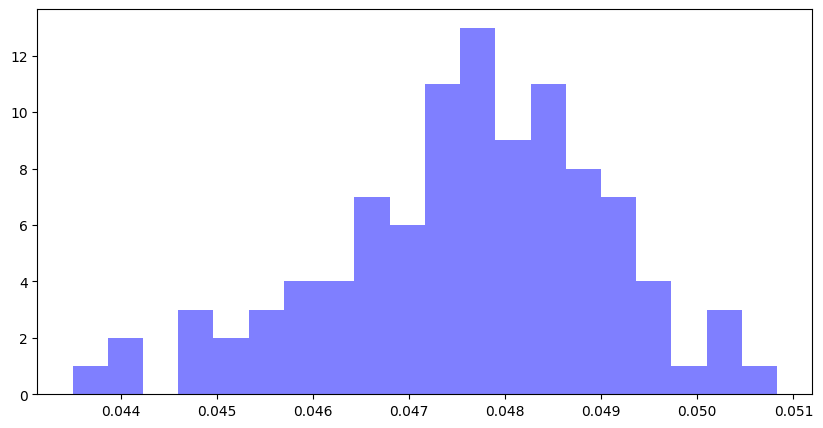

Confidence interval: (0.04475778162926184, 0.050479388007653815)


In [5]:
# Repeat 100 times and plot histogram

fraction_similar_edges_shuffled = [shuffle_field_labels_frac(G_sub) for i in range(100)]

fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.hist(fraction_similar_edges_shuffled, bins=20, color='blue', alpha=0.5, label='Shuffled')

plt.show()

# Compute confidence interval for fraction of edges between similar nodes

from scipy.stats import norm

# Compute mean and standard deviation of shuffled fractions
mean = np.mean(fraction_similar_edges_shuffled)
std = np.std(fraction_similar_edges_shuffled)

# Compute confidence interval

conf_int = norm.interval(0.95, loc=mean, scale=std)

print('Confidence interval:', conf_int)

Considering the confidence 95 % interval (0.0448, 0.0505) for the fraction mean of the shuffled graph. The results of the orignal graph is significantly different with a fraction mean of 0.427 than the fraction mean of a graph where associations between nodes are shuffled. We can therefore conclude that the chance to connect to a member of the same field is significantly higher than it would be by chance.

* Compute the assortativity coefficient with respect to author's field. How do you interpret the value you obtain? (Hint: See this paper, eq (2)). Important: here I do not want you to use the NetworkX implementation, but rather to implement your own version of the measure.

From the suggested paper we get eq. 2:
$$r=\frac{\sum_i e_{ii}-\sum_i a_i b_i}{1-\sum_i a_i b_i}=\frac{\text{Tr}\,\mathbf{e}-||\mathbf{e}^2||}{1-||\mathbf{e}^2||}$$

where $\mathbf{e}$ is the matrix whose elements are $e_{ij}$ (which
we define to be the fraction of edges in a network that connect a vertex of type $i$ to one of type $j$) and $||\mathbf{x}||$ means the sum of all elements of the matrix $\mathbf{x}$

In [53]:
# Functions to Manually compute assortativity coefficients

def compute_assortativity(G, data="field"):
    
    #Compute mixing matrix:
    MM = nx.attribute_mixing_matrix(G, data)

    # Calcualte trace of mixing matrix:
    tr = np.trace(MM)
    MSQ = np.sum(MM@MM)

    return (tr-MSQ) / (1-MSQ)


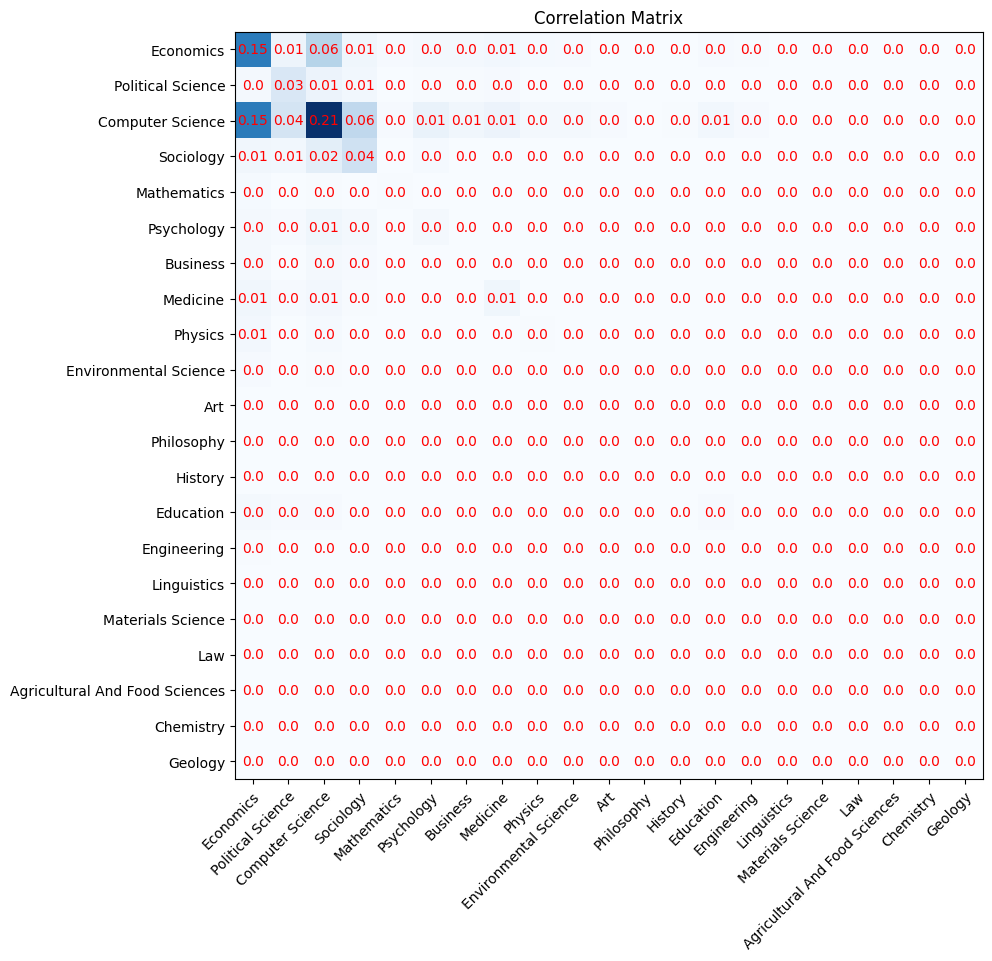

Assortativity coefficient: (Field) 0.23594503583580134


In [54]:
# Compute Parameters correlation matrix

field_inx = {key : idx for idx, key in enumerate(possible_fields)}

corr_matrix = np.zeros((len(possible_fields), len(possible_fields)))

for edge in G_sub.edges:
    corr_matrix[field_inx[G.nodes[edge[0]]['field']], field_inx[G_sub.nodes[edge[1]]['field']]] += 1

corr_matrix = corr_matrix / np.sum(corr_matrix)

# Plot correlation matrix

fig, ax = plt.subplots(figsize=(10, 10))

im = ax.imshow(corr_matrix, cmap='Blues')

# Show all ticks and label them with the respective list entries

ax.set_xticks(np.arange(len(possible_fields)))
ax.set_yticks(np.arange(len(possible_fields)))
ax.set_xticklabels(possible_fields)
ax.set_yticklabels(possible_fields)

# Rotate the tick labels and set their alignment.

plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
            rotation_mode="anchor")

# Loop over data dimensions and create text annotations.

for i in range(len(possible_fields)):
    for j in range(len(possible_fields)):
        text = ax.text(j, i, round(corr_matrix[i, j],2),
                       ha="center", va="center", color="r")


ax.set_title("Correlation Matrix")
fig.tight_layout()
plt.show()


print("Assortativity coefficient: (Field)", compute_assortativity(G))
#print("Assortativity coefficient: (Count)", compute_assortativity(G_shuffled,data= 'median_count'))

* Is the graph assortative with respect to the degree? (e.g. do high-degree scientists tend to link to other high-degree scientists, and low-degree scientists to other low-degree scientists?). Provide an interpretation of your answer.

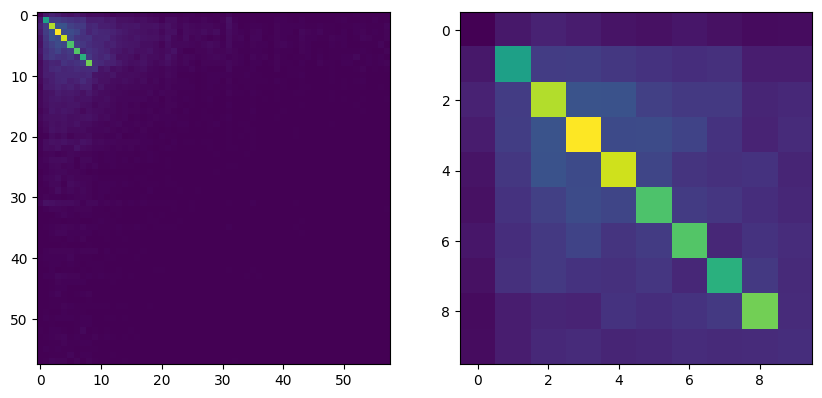

 Degree assortativity coefficient: 0.004614898756558286


In [56]:
# degree assortativity coefficient
degree_matrix = nx.degree_mixing_matrix(G_sub, normalized=True)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

ax[0].imshow(degree_matrix)
ax[1].imshow(degree_matrix[:10,:10])

plt.show()


# Compute and display assortativity coefficient
coef = nx.degree_assortativity_coefficient(G_sub)

print(f" Degree assortativity coefficient: {coef}")

Interpreting the degree assortativty matrix for degrees 0-9 points towards the graph being assortative. Yet, the degree assortativity coefficient displays only little assortativity between authors and their number of author pairs in the CSS Papers.

Considering the spread in degrees the matrix easily appear more assortative than it actually is. Thus the network is marginally assortative with respect to degree

## Part 2: Communities

### Exercise 2: Zachary's karate club
In this exercise, we will work on Zarachy's karate club graph (refer to the Introduction of Chapter 9). The dataset is available in NetworkX, by calling the function karate_club_graph

In [9]:
# Load Karate Club Graph
karate_club_graph = nx.karate_club_graph()


# add node group for color in netwulf
for node,data in karate_club_graph.nodes(data=True):
    data['group'] = data['club']

# add degree as node size in netwulf
for node,data in karate_club_graph.nodes(data=True):
    data['size'] = karate_club_graph.degree(node)

# add edge weight as edge width in netwulf
for edge1,edge2,data in karate_club_graph.edges(data=True):
    data['width'] = data['weight']

* Visualize the graph using netwulf. Set the color of each node based on the club split (the information is stored as a node attribute).

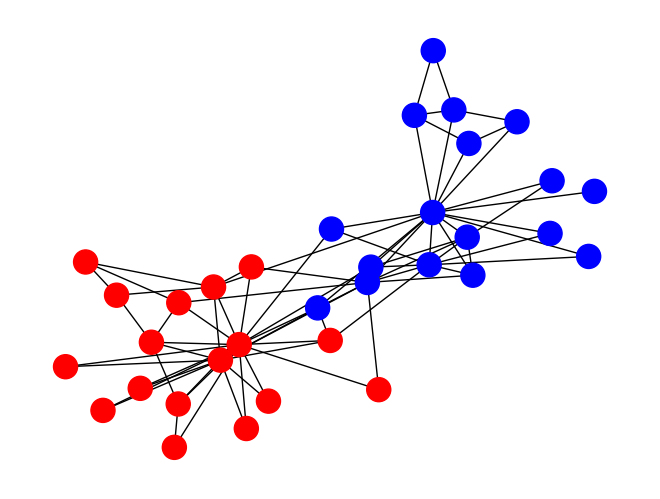

In [10]:
# Visualize Graph
unique_clubs = set([karate_club_graph.nodes[node]['club'] for node in karate_club_graph.nodes])

color_map = {unique_clubs.pop() : 'red', unique_clubs.pop() : 'blue'}

nx.draw(karate_club_graph, node_color=[color_map[karate_club_graph.nodes[node]['club']] for node in karate_club_graph.nodes])

* Write a function to compute the modularity of a graph partitioning (use equation 9.12 in the book). The function should take a networkX Graph and a partitioning as inputs and return the modularity.

In [11]:
# Define a function to calculate modularity from a given partition

def modularity(G, partition):

    L = G.number_of_edges()
    
    M = 0

    for community in partition:
        G_C = G.subgraph(community).copy()
        L_C = G_C.number_of_edges()
        # Degrees of nodes in community or in Total Graph?
        k_c = sum([G_C.degree(node) for node in G_C.nodes])

        M_C = L_C / L - (k_c / (2 * L))**2
        M += M_C
    
    return M

* Explain in your own words the concept of modularity.

Modularity takes a partioning of a network/graph in groups. Given that partioning Modularity is a measure for how well that group partioning is reflected within the graph's structure of edges and nodes

* Compute the modularity of the Karate club split partitioning using the function you just wrote. Note: the Karate club split partitioning is available as a node attribute, called "club".

In [12]:
# Define Partition
C1 = [node for node in karate_club_graph.nodes if karate_club_graph.nodes[node]['club'] == 'Mr. Hi']
C2 = [node for node in karate_club_graph.nodes if karate_club_graph.nodes[node]['club'] == 'Officer']

# Compute Modularity of partition
print('Modularity of original partition:', modularity(karate_club_graph, [C1, C2]))

Modularity of original partition: 0.48931623931623935


* We will now perform a small randomization experiment to assess if the modularity you just computed is statitically different from 0. To do so, we will implement the double edge swap algorithm. The double edge swap algorithm is quite old... it was implemented in 1891 (!) by Danish mathematician Julius Petersen (https://en.wikipedia.org/wiki/Julius_Petersen). Given a network G, this algorithm creates a new network, such that each node has exactly the same degree as in the original network, but different connections. Here is how the algorithm works.

    1. Create an identical copy of your original network.
    2. Consider two edges in your new network (u,v) and (x,y), such that u!=v and v!=x.
    3. If none of edges (u,y) and (x,v) exists already, add them to the network and remove edges (u,v) and (x,y).
    
    Repeat steps 2. and 3. to achieve at least N swaps (I suggest N to be larger than the number of edges).

* Double check that your algorithm works well, by showing that the degree of nodes in the original network and the new 'randomized' version of the network are the same.

In [13]:
# Define double edge swap function

def double_edge_swap(G, n_swap=100):
    G_swapped = G.copy()
    for swap in range(n_swap):
        # Get random edge
        edge1,edge2 = random.sample(list(G_swapped.edges),2)

        u,v = edge1
        x,y = edge2

        # Check swap is valid
        if u == y or v == x: 
            continue

        # Check if new edges already exist
        if G_swapped.has_edge(u,y) or G_swapped.has_edge(v,x):
            continue

        # Remove edge
        G_swapped.remove_edge(u,v)
        G_swapped.remove_edge(x,y)

        # Add new edges
        G_swapped.add_edge(u,y)
        G_swapped.add_edge(x,v)

    return G_swapped


# Display Swapped Graph equal degree for each node
karate_swapped = double_edge_swap(karate_club_graph, n_swap=100)
print(all([karate_club_graph.degree(node) == karate_swapped.degree(node) for node in karate_club_graph.nodes]))

True


It can be seen that each node maintains the same dregree when the network is parsed through the double_edge_swap algorithem

* Create $1000$ randomized version of the Karate Club network using the double edge swap algorithm you wrote in step 5. For each of them, compute the modularity of the "club" split and store it in a list.

In [14]:
# Define function for randomized version of double edge swap modularity

def ex_modularity(G, n_swap=100, experiments=1000):

    modularity_values = []

    for experiment in range(experiments):
        G_swapped = double_edge_swap(G, n_swap=n_swap)
        C1 = [node for node in G_swapped.nodes if G_swapped.nodes[node]['club'] == 'Mr. Hi']
        C2 = [node for node in G_swapped.nodes if G_swapped.nodes[node]['club'] == 'Officer']
        modularity_values.append(modularity(G_swapped, [C1, C2]))

    return modularity_values

modularity_values = ex_modularity(karate_club_graph, n_swap=1000, experiments=1000)

* Compute the average and standard deviation of the modularity for the random network.

In [15]:
# Compute mean and standard deviation of modularity values
mean_modularity = np.mean(modularity_values)
std_modularity = np.std(modularity_values)

print(F"Mean modularity: {mean_modularity}, Standard deviation: {std_modularity}")

Mean modularity: 0.22434976988823144, Standard deviation: 0.027934808210757552


* Plot the distribution of the "random" modularity. Plot the actual modularity of the club split as a vertical line (use axvline).

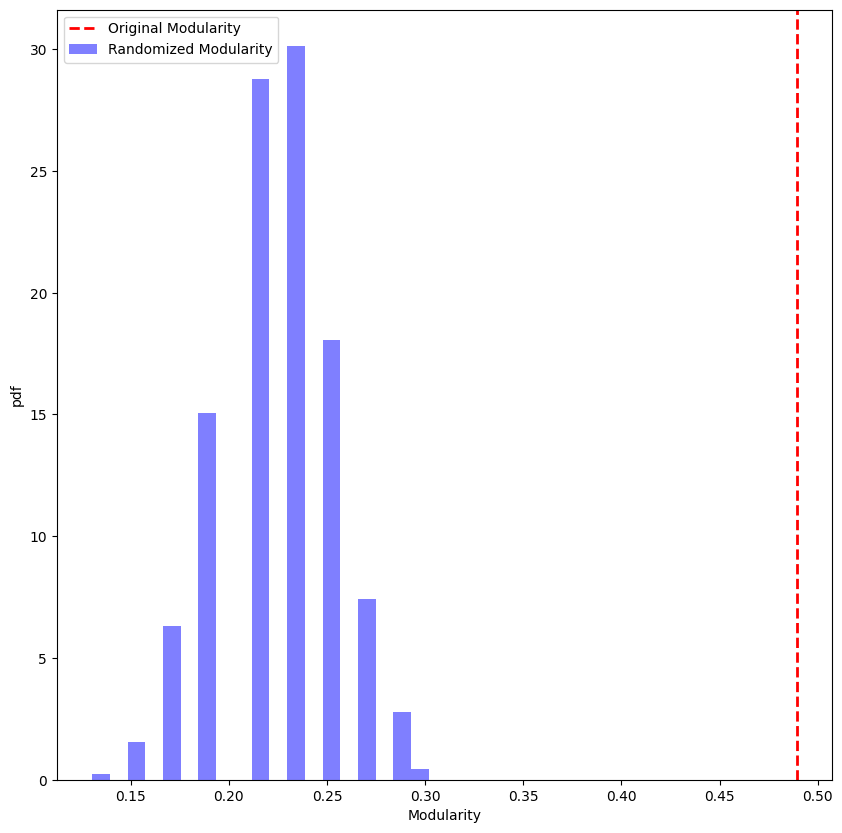

In [16]:
# plot histogram of modularity values
bins = np.linspace(min(modularity_values), max(modularity_values), 20)
hist, edges = np.histogram(modularity_values, bins=bins, density=True)
x = (edges[:-1] + edges[1:]) / 2
width = bins[1] - bins[0]

fig , ax = plt.subplots(figsize=(10, 10))

ax.bar(x, hist, width=width, color='blue', alpha=0.5)

# Display Original Modularity as vertical line
ax.axvline(x=modularity(karate_club_graph, [C1, C2]), color='red', linestyle='--', linewidth=2)
ax.legend(['Original Modularity', 'Randomized Modularity'])

plt.xlabel('Modularity')
plt.ylabel('pdf')

plt.show()


* Comment on the figure. Is the club split a good partitioning? Why do you think I asked you to perform a randomization experiment? What is the reason why we preserved the nodes degree?

The plot shows that the club split is a good partitioning of the network, since the modularity is way higher than that of the random variants.
The randomization experiment shows that the Random Hypothesis: "Randomly wired networks lack an inherent community structure" appears to be true.
The nodes degree are important since real life networks display degree correlations. This means that nodes with similar degrees are often clustered together, thus being crucial to community strucures. This is not the case for random networks however, and this difference shows.

* Use the Python Louvain-algorithm implementation to find communities in this graph. Report the value of modularity found by the algorithm. Is it higher or lower than what you found above for the club split? What does this comparison reveal?

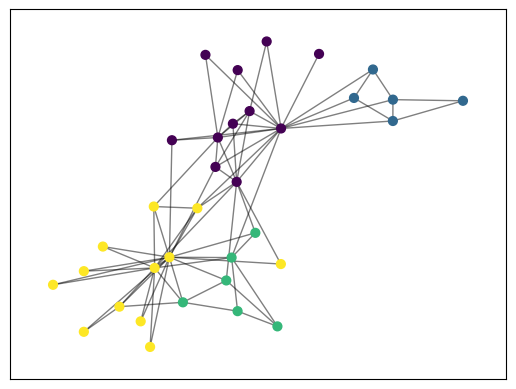

Modularity of Louvain partition: 0.44490358126721763
Modularity of original partition: 0.48931623931623935


In [17]:
#first compute the best partition
louvain_partition_karate = community_louvain.best_partition(karate_club_graph,random_state=0)


# draw the graph
pos = nx.spring_layout(karate_club_graph)

# color the nodes according to their partition
nx.draw_networkx_nodes(karate_club_graph, pos, louvain_partition_karate.keys(), node_size=40, node_color=list(louvain_partition_karate.values()))
nx.draw_networkx_edges(karate_club_graph, pos, alpha=0.5)
plt.show()

# Compute modularity of partition and Original partition
print('Modularity of Louvain partition:', community_louvain.modularity(louvain_partition_karate, karate_club_graph))
print('Modularity of original partition:', modularity(karate_club_graph, [C1, C2]))

The found partitioning has a lower modularity than the optimal partitioig. This shows how finding an optimal partioning of a network is no easy task.

The Louvain finds a partioning with a high modularity score yet not as high as the original partitioning. Additially, we know that the Louvain algorithm has a random element, thus the partitioning currently found is not guaranteed due to the randomness.

* Compare the communities found by the Louvain algorithm with the club split partitioning by creating a matrix $D$ with dimension $(2 \times A)$, where $A$ is the number of communities found by Louvain. We set entry $D(i,j)$ to be the number of nodes that community $i$ has in common with group split $j$. The matrix $D$ is what we call a confusion matrix. Use the confusion matrix to explain how well the communities you've detected correspond to the club split partitioning.

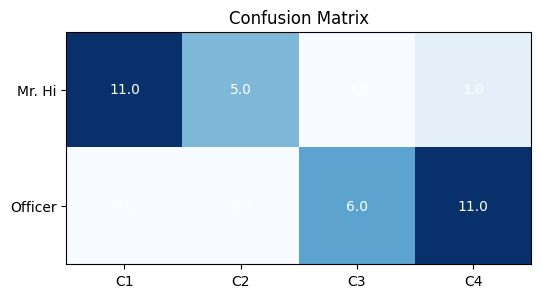

In [18]:
# Compute confusion matrix
confusion_matrix = np.zeros((2,4))

# Loop over nodes to compute confusion matrix
for node in karate_club_graph.nodes:
    if karate_club_graph.nodes[node]['club'] == 'Mr. Hi':
        confusion_matrix[0,louvain_partition_karate[node]] += 1
    else:
        confusion_matrix[1,louvain_partition_karate[node]] += 1

# Display confusion matrix
fig, ax = plt.subplots(figsize=(6, 6))

ax.imshow(confusion_matrix,cmap = 'Blues')

# Set ticks and Labels as Groups
ax.set_xticks([0,1,2,3])
ax.set_yticks([0,1])

ax.set_xticklabels(['C1', 'C2', 'C3', 'C4'])
ax.set_yticklabels(['Mr. Hi', 'Officer'])

# Display values in confusion matrix
for i in range(2):
    for j in range(4):
        ax.text(j, i, confusion_matrix[i, j], ha="center", va="center", color="w")

# Set title
ax.set_title('Confusion Matrix')

plt.show()

From the confusion matrix it can be seen that the lovain algorithem almost perfectly splits the original groups, but also splits each karate club in to two sub communities

### Exercise 3: Community detection on the network of Computational Social Scientists.

* Consider the network you built in Week 4.
* Use the Python Louvain-algorithm implementation to find communities. How many communities do you find? What are their sizes? Report the value of modularity found by the algorithm. Is the modularity significantly different than 0?

In [19]:
#first compute the best partition
louvain_partition = community_louvain.best_partition(G_sub,random_state=0)

G_field = G_sub.copy()
G_louvain = G_sub.copy()

# Set Group attribute for each node to display
for node in G_sub.nodes:
    G_field.nodes[node]['group'] = G_sub.nodes[node]['field']
    G_louvain.nodes[node]['group'] = louvain_partition[node]

# Set size attribute for each node to display
for node in G_sub.nodes:
    G_field.nodes[node]['size'] = G_sub.degree(node)*100
    G_louvain.nodes[node]['size'] = G_sub.degree(node)*100

# Set width attribute for each edge to display
for edge in G_sub.edges:
    G_field.edges[edge]['width'] = G_sub.edges[edge]['weight']
    G_louvain.edges[edge]['width'] = G_sub.edges[edge]['weight']

# Get number of groups for field partition and louvain partition

n_field = len(possible_fields)
n_louvain = len(set(louvain_partition.values()))

print(f"Field has {n_field} groups and Louvain has {n_louvain} groups")

# Get field partition
field_partition = {node: G_field.nodes[node]['group'] for node in G_field.nodes}


print("modularity: Lovain ", community_louvain.modularity(louvain_partition, G_field))
print("modularity: field ", community_louvain.modularity(field_partition, G_field))


Field has 21 groups and Louvain has 73 groups
modularity: Lovain  0.8827003649021616
modularity: field  0.1521745758409628


C:\Users\rebek\AppData\Local\Temp\ipykernel_20608\2075157750.py:26: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(possible_fields)


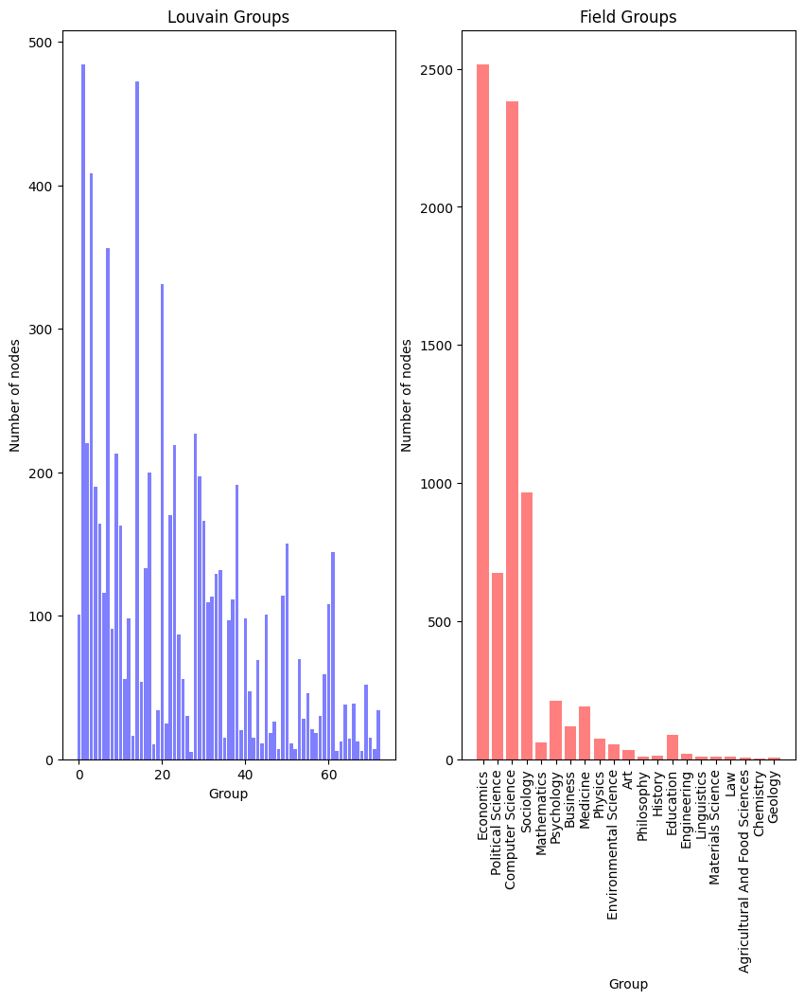

In [20]:
# Analyze Louvain partition

# Get members of each group
louvain_groups = {group: len([node for node in G_louvain.nodes if G_louvain.nodes[node]['group'] == group]) for group in set(louvain_partition.values())}
field_groups = {group: len([node for node in G_field.nodes if G_field.nodes[node]['group'] == group]) for group in possible_fields}

# plot amount of nodes in each group

fig, ax = plt.subplots(1,2, figsize=(10, 10))
ax1 = ax[0]
ax2 = ax[1]

# Plot louvain groups as bar plot
ax1.bar(louvain_groups.keys(), louvain_groups.values(), color='blue', alpha=0.5)
ax1.set_title('Louvain Groups')
ax1.set_xlabel('Group')
ax1.set_ylabel('Number of nodes')

# Plot field groups as bar plot
ax2.bar(field_groups.keys(), field_groups.values(), color='red', alpha=0.5)
ax2.set_title('Field Groups')
ax2.set_xlabel('Group')
ax2.set_ylabel('Number of nodes')

# Display x_ticks as field names and display them vertically
ax2.set_xticklabels(possible_fields)
plt.xticks(rotation=90)

plt.show()

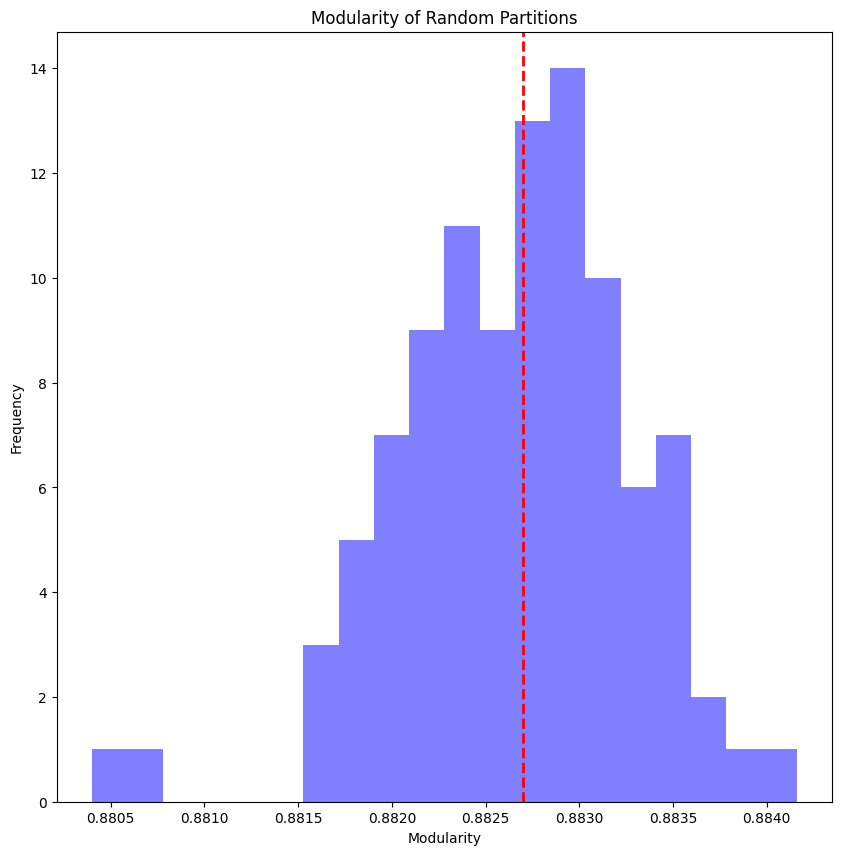

Mean: 0.8826553829141147 \pm 0.0001211228191491503


In [21]:
# Use Double Swap algorithm to compute modularity of random partitions

# Compute modularity of random partitions
modularity_values = []
for i in range(100):
    partition = community_louvain.best_partition(G_louvain,random_state=i)
    modularity_values.append(community_louvain.modularity(partition, G_louvain))

# Plot histogram of modularity values

fig, ax = plt.subplots(figsize=(10, 10))

# Display histogram of modularity values
ax.hist(modularity_values, bins=20, color='blue', alpha=0.5)

# Display original modularity value
ax.axvline(x=community_louvain.modularity(louvain_partition, G_sub), color='red', linestyle='dashed', linewidth=2)

# Set title and labels
ax.set_title('Modularity of Random Partitions')
ax.set_xlabel('Modularity')
ax.set_ylabel('Frequency')

plt.show()

# Compute Mean and Standard Deviation of modularity values along with confidence interval
mean = np.mean(modularity_values)
std = np.std(modularity_values)
conf_int = 1.96*std/np.sqrt(len(modularity_values))

print(fr"Mean: {mean} \pm {conf_int}")

Following 100 iterations of community detection with the python louviatan algortihem we see the modularity of the communties found are significantly different from 0 

* Visualize the network, using netwulf (see Week 5). This time assign each node a different color based on their community. Describe the structure you observe.

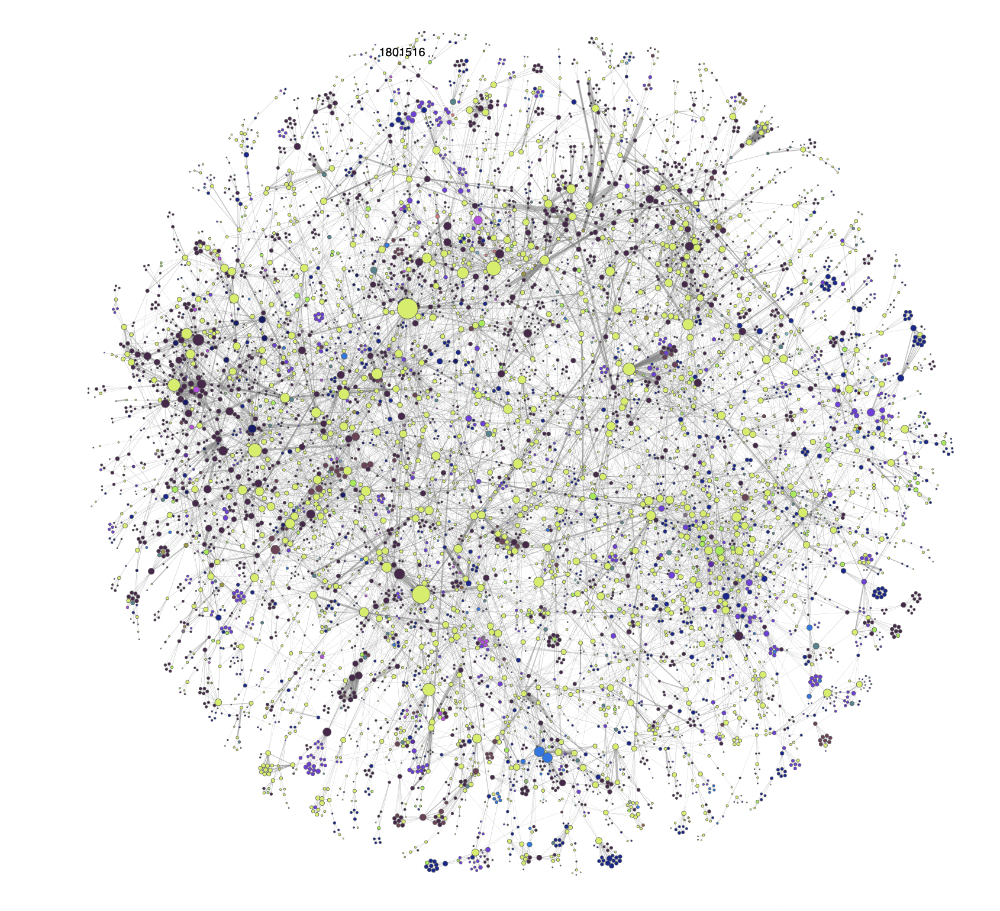

In [22]:
# Display network with field partition as color, degree as size and weight as width

#nw.visualize(G_field)
# Use Saved Image
from IPython.display import Image
Image(filename='GraphViz/Field.png')


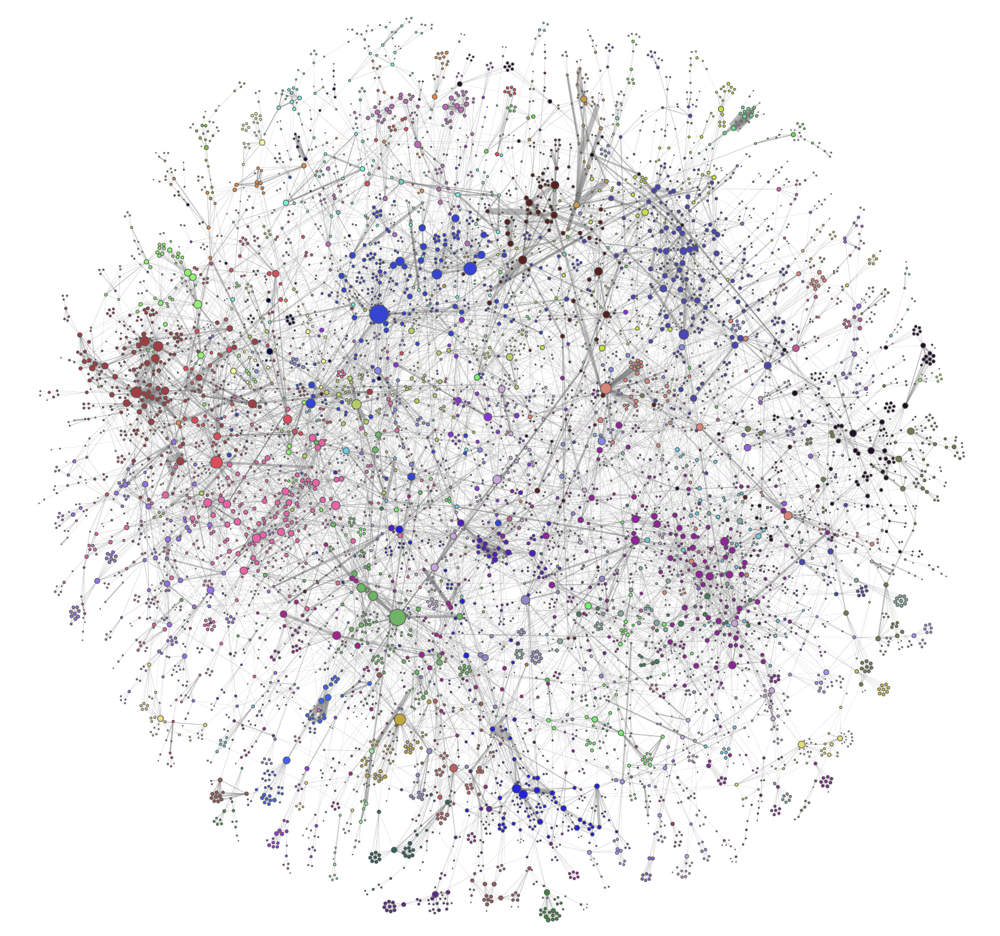

In [23]:
# Display network with louvain partition as color, degree as size and weight as width

#nw.visualize(G_louvain)
# Use Saved Image
from IPython.display import Image
Image(filename='GraphViz/Louvain.png')

## Part 3: TF-IDF

In [24]:
css_papers = pd.read_excel("CSS_Papers.xlsx")
css_papers.keywords = [eval(css_papers.keywords[i]) for i in range(len(css_papers))]
css_papers.authorIds = [eval(css_papers.authorIds[i]) for i in range(len(css_papers))]
css_papers.author_fields = [eval(css_papers.author_fields[i]) for i in range(len(css_papers))]

In [25]:
filename = "shared_data\\author_subset.pkl"

file = open(filename, 'rb')
AuthorData = pkl.load(file)
file.close()

### Exercise 4: TF-IDF and the Computational Social Science communities.
The goal for this exercise is to find the words charachterizing each of the communities of Computational Social Scientists. What you ned for this exercise:
* The assignment of each author to their network community, and the degree of each author (Week 6, Exercise 4). This can be stored in a dataframe or in two dictionaries, as you prefer.
* the tokenized abstract dataframe (Week 7, Exercise 2)

In [26]:
abstracts = pd.read_csv('CSS_Abstracts.csv', index_col=0)

G_sub = G.subgraph(largest_cc).copy()
partition = community_louvain.best_partition(G_sub,random_state=0)

1. First, check out the wikipedia page for TF-IDF. Explain in your own words the point of TF-IDF.
* What does TF stand for?

TF (Term Frequency) refers to the frequency of a term (i.e., a word or phrase) in a document. It is calculated as the number of times a term appears in a document divided by the total number of terms in that document. TF assigns a weight to each term in a document based on how frequently it appears in that document.

The TF is typically calculated as:
$$\texttt{tf}(t,d)=\frac{f_{t,d}}{\sum_{t'\in d}f_{t',d}}$$
where $f_{t,d}$ is the raw count of a term $t$ in a document $d$ and $\sum_{t'\in d}f_{t',d}$ is the total number of terms in a document.

* What does IDF stand for?

IDF (Inverse Document Frequency) measures the importance of a term across a collection of documents. It is calculated as the logarithm of the total number of documents divided by the number of documents that contain the term. IDF assigns a weight to each term in a collection of documents based on how common or rare it is across all documents. Terms that are rare across documents (i.e., appear in few documents) are given higher weights than terms that are common across documents (i.e., appear in many documents).

IDF is typically calculated as:
$$\texttt{idf}(t,D) = \log{\frac{N}{|\{d\in D:t\in d\}|}}$$
where $N=|D|$ is the total number of documents in the collection $D$, and $|\{d\in D:t\in d\}|$ is the number of documents where the term $t$ appears

2. Now, we want to find out which words are important for each community, so we're going to create several *large documents, one for each community*. Each document includes all the tokens of abstracts written by members of a given community.
* Consider a community c
* Find all the abstracts of papers written by a member of community c.
* Create a long array that stores all the abstract tokens
* Repeat for all the communities.

**Note:** Here, to ensure your code is efficient, you shall exploit pandas builtin functions, such as groupby.apply or explode.

In [27]:
print(all(abstracts.paperId == css_papers.paperId))
abstracts['authorIds'] = css_papers.authorIds
abstracts['author_fields'] = css_papers.author_fields
abstracts.head()

True


,paperId,abstract,year,tokens,authorIds,author_fields
0,c816d0003083c3a92ade5f3dbc8419cb5cd91b11,The paper generalises estimation and inference...,2009,"['paper', 'generalises', 'estimation', 'infere...",[2143569],[Economics]
1,843f972bd9688a3c26798c93fed09f070ca79c8b,In this work we ask the question: what are the...,2009,"['work', 'ask', 'question', 'challenges', 'man...","[1746214, 2833225, 1699751, 1778110, 41224057]","[Computer Science, Computer Science, Computer ..."
2,40570ef9dede55251d4c3a8de05da82a56fdc7b0,A central task of artificial intelligence is t...,2009,"['central', 'task', 'artificial', 'intelligenc...","[144652072, 21889436]","[Computer Science, Computer Science]"
3,018c0da501bd067daf3b1bfb96fe73760b8abf71,NaN,2009,NaN,[144913176],[Computer Science]
4,4af26bf68b04308cae8825cdfa2db3679a8588bd,This neat piece of work emphasizes once more t...,2009,"['neat', 'piece', 'work', 'emphasizes', 'need'...",[144913176],[Computer Science]


In [28]:
exploded_abstracts = abstracts.explode(['authorIds','author_fields'])
exploded_abstracts = exploded_abstracts.groupby(['authorIds'], group_keys=True).apply(lambda x: x)
exploded_abstracts.dropna(subset=['tokens'], inplace=True)

In [29]:
vocab = np.empty(max(partition.values()), dtype=list)

for c in range(max(partition.values())):
    vocab_c = []
    for author in np.array([*partition.keys()])[(np.array([*partition.values()]) == c)]:
        try:
            vocab_c.append(sum(exploded_abstracts.loc[author].tokens.apply(lambda x: [i for i in eval(x)]), []))
        except:
            pass

    vocab[c]= [i for sub in vocab_c for i in sub]

3. Now, we're ready to calculate the TF for each word. Use the method of your choice to find the **top 5 terms** within the top 5 communities (by number of authors).

* Describe similarities and differences between the communities.
* Why aren't the TFs not necessarily a good description of the communities?
* Next, we calculate IDF for every word.
* What base logarithm did you use? Is that important?

In [30]:
ctr = Counter(list(partition.values()))
top5_communitities = [i[0] for i in ctr.most_common(5)]
top5_communitities

[1, 14, 3, 7, 20]

In [31]:
tfs = []

for i, c in enumerate(range(max(partition.values()))):
    frequency = nltk.FreqDist(vocab[c])
    
    for word in frequency.keys():
        frequency[word] = frequency[word]/len(vocab[c])

    tfs.append(frequency)

for i, c in enumerate(top5_communitities):
    print(f"Top 5 terms in community ranked {i+1}:")
    print(sorted(tfs[c], key=tfs[c].get, reverse=True)[:5])
    print()

Top 5 terms in community ranked 1:
['agents', 'show', 'model', 'social', 'information']

Top 5 terms in community ranked 2:
['social', 'media', 'data', 'online', 'work']

Top 5 terms in community ranked 3:
['social', 'data', 'network', 'model', 'different']

Top 5 terms in community ranked 4:
['social', 'data', 'show', 'information', 'results']

Top 5 terms in community ranked 5:
['network', 'model', 'networks', 'social', 'find']



For the top 5 communities, similarities are quite visible; In all 5 communities the term social is in the top 5, as well as many of the other terms being repeated across the top 5's. However small differences are also present, such as the most frequent term in community 1; agents, which does not appear in the other. Words like "network" also appear to be very frequent in C5 and C3 but not in the other communities which also show small differences in scientific focus.

It can be seen from the top 5 communities' top 5 terms, that TFs are not necessarily a good description of the communities. We see that 3/5 communities have the term 'social' as their most frequent term, and 3/5 have the terms 'data' and 'model' amongst their top 5 terms. The TF is likely not a great description of the communities, because all communities are sub-segment of computational social science, where specific language and vocabulary is inherently used across sub-segments.

One way to make the TFs a more reliable measure could be to identify relevant stopwords for the CCS field and remove these further.

In [32]:
from tqdm import tqdm

allwords = set([w for w in vocab[i] for i in range(max(partition.values()))])

def count_dict(vocabulary):
    word_count = {}
    for word in tqdm(allwords):
        word_count[word] = 0
        for document in vocabulary:
            if word in document:
                word_count[word] += 1
    return word_count
 
word_count = count_dict(vocab)

100%|██████████| 5397/5397 [04:39<00:00, 19.29it/s]


In [33]:
idfs = {}
N = len(vocab)

for w in allwords:
    idfs[w] = np.log2(N/(word_count[w]))

idfs

{'mining': 1.0,
 'drive': 0.9219974879987268,
 'exchanges': 1.4150374992788437,
 'depends': 0.615336149764675,
 'ethical': 1.2630344058337937,
 'shifted': 1.7104933828050153,
 'telcos': 5.169925001442312,
 'routes': 1.5260688116675876,
 'message': 1.1255308820838588,
 'obesity': 3.169925001442312,
 'academia': 1.5260688116675876,
 'exponential': 1.2157286910554372,
 'spatial': 0.615336149764675,
 'births': 4.169925001442312,
 'requested': 2.84799690655495,
 'caldarelli': 5.169925001442312,
 'keyphrases': 5.169925001442312,
 'final': 0.8479969065549501,
 'innovation': 0.7104933828050152,
 'travel': 0.8845227825800641,
 'together': 0.38856528791765277,
 'bogotá': 4.169925001442312,
 'justin': 4.169925001442312,
 'attendees': 2.84799690655495,
 'prompted': 3.0,
 'involve': 1.0,
 'searching': 1.3119440063147403,
 'technologically': 2.7104933828050153,
 'movie': 2.169925001442312,
 'freedom': 1.4150374992788437,
 'orders': 1.1699250014423124,
 'race': 1.4150374992788437,
 'peculiarities': 2

For any log-base, the idf value will increase less rapidly as the real inverse document frequency increases. This helps stabelize the range of the idf values calculated. In the above calculation, we use a log-base 2, as this is most commonly used in TF-IDF literature.

However, the choice of base does not matter as long as the choice is consistent, as mathematically we can always change the base using:
$$\log_b(x)=\frac{\log_a(x)}{\log_a(b)}$$

4. We're ready to calculate TF-IDF. Do that for the top 9 communities (by number of authors). Then for each community:
* List the 10 top TF words
* List the 10 top TF-IDF words
* List the top 3 authors (by degree)
* Are these 10 words more descriptive of the community? If yes, what is it about IDF that makes the words more informative?

In [34]:
top9_communitities = [i[0] for i in ctr.most_common(9)]
top9_communitities

[1, 14, 3, 7, 20, 28, 2, 23, 9]

In [36]:
allwords = set([w for w in vocab[i] for i in top9_communitities])

def count_dict(vocabulary):
    word_count = {}
    for word in tqdm(allwords):
        word_count[word] = 0
        for document in vocabulary:
            if word in document:
                word_count[word] += 1
    return word_count
 
word_count_9 = count_dict(vocab[top9_communitities])

idfs = {}
N = len(vocab[top9_communitities])

for w in allwords:
    idfs[w] = np.log2(N/(word_count_9[w] + 1))

100%|██████████| 5397/5397 [01:57<00:00, 45.77it/s] 


In [37]:
tdidfs = []

for c in top9_communitities:
    tdidf = {}
    for w in allwords:
        tdidf[w] = tfs[c][w]*idfs[w]
    tdidfs.append(tdidf)

In [38]:
for i, c in enumerate(top9_communitities):
    print(f"Top {i} community:")
    print(f"Top 10 TF words: {sorted(tfs[c], key=tfs[c].get, reverse=True)[:10]}")
    print(f"Top 10 TF-IDF words: {sorted(tdidfs[i], key=tdidfs[i].get, reverse=True)[:10]}")
    authors_in_c = dict(G.degree(np.array([*partition.keys()])[(np.array([*partition.values()]) == c)]))
    k = Counter(authors_in_c)
    top3_authors = [AuthorData[AuthorData.authorId == i[0]].name.iloc[0] for i in k.most_common(3)]
    print(f"Top 3 authors: {top3_authors}")
    print()

Top 0 community:
Top 10 TF words: ['agents', 'show', 'model', 'social', 'information', 'mechanism', 'optimal', 'market', 'study', 'equilibrium']
Top 10 TF-IDF words: ['bidders', 'seller', 'bidder', 'auctions', 'approximation', 'bounds', 'reserve', 'truthful', 'applicants', 'scoring']
Top 3 authors: ['J. Kleinberg', 'Nicole Immorlica', 'Sharad Goel']

Top 1 community:
Top 10 TF words: ['social', 'media', 'data', 'online', 'work', 'research', 'use', 'community', 'people', 'information']
Top 10 TF-IDF words: ['super', 'youth', 'dfs', 'drama', 'bangladesh', 'fandom', 'deviance', 'whatsapp', 'messenger', 'stereotypes']
Top 3 authors: ['Brian Keegan', 'Brent J. Hecht', 'Neha Kumar']

Top 2 community:
Top 10 TF words: ['social', 'data', 'network', 'model', 'different', 'results', 'show', 'networks', 'mobility', 'study']
Top 10 TF-IDF words: ['measles', 'refugees', 'outbreak', 'turkish', 'synchronization', 'directors', 'cures', 'influenza', 'recommender', 'quarantines']
Top 3 authors: ['J. Ram

Comment on Are these 10 words more descriptive of the community? If yes, what is it about IDF that makes the words more informative?

The TD-IDF words are more in-depth and nieche than the TF words, which makes the communities easier to distinguish, however the TD-IDF words doesnt capture the general discriptive worsd of each community. E.g in community 2 the TD-IDF words gives the impression on the research being solely virus based, and not nescessarily within CSS.

### Exercise 5: The Wordcloud. It's time to visualize our results!

* Install the WordCloud module.
* Now, create word-cloud for each community. Feel free to make it as fancy or non-fancy as you like.
* Make sure that, together with the word cloud, you print the names of the top three authors in each community (see my plot above for inspiration).

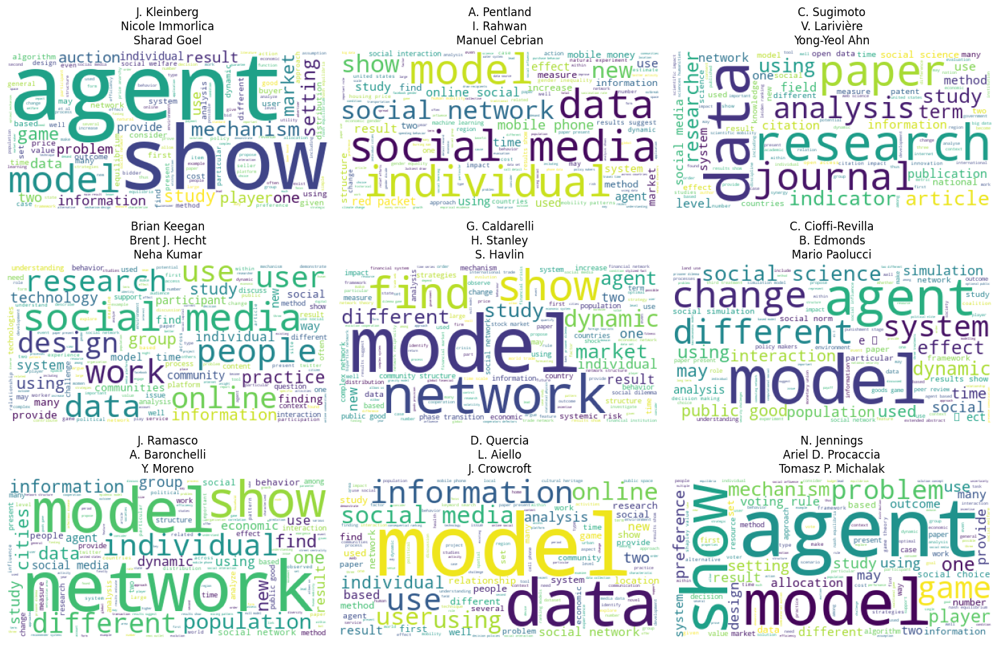

In [39]:
fig, axs = plt.subplots(3,3, figsize = (15, 10), tight_layout = True)
for i, c in enumerate(top9_communitities):
    wordcloud = WordCloud(background_color="white").generate((" ").join(vocab[c]))
    authors_in_c = dict(G.degree(np.array([*partition.keys()])[(np.array([*partition.values()]) == c)]))
    k = Counter(authors_in_c)
    top3_authors = [AuthorData[AuthorData.authorId == i[0]].name.iloc[0] for i in k.most_common(3)]
    axs[i % 3, i // 3].imshow(wordcloud)
    axs[i % 3, i // 3].axis("off")
    string = '\n'
    axs[i % 3, i // 3].set_title(f"{string.join(map(str, top3_authors))}")
plt.show()

* Comment on your results. What can you conclude on the different sub-communities in Computational Social Science?

The sub-communities have different research foci, as evident e.g. in between community 1 and 4, where the first is focused on games, agents, players and other game theory terms, whereas the latter focuses on e.g social media and other online networks. However, some of the less used words in the clouds also reveal differences between communities.

Many of them have trends in common, evident by words like model, social, show, which are perhaps more common words when writing research papers in the computational social science field.

In conclusion the communities are similar in general but there also appears to be a lot of topic diversity when considering more than the most used words.


* Look up online the top author in each community. In light of your search, do your results make sense?

Rank of Community | Author Name | Affiliated Research Centers | Overview of Research 
 :- | :-: | :-: | :-: 
 1 | Brian Keegan | University of Colorado Boulder, and the Colorado Laboratory for Users, Media, and Networks (COLUMN) | Brian Keegan's research focuses on using computational methods to understand and analyze social networks, particularly online networks (i.e. Wikipedia, Reddit, and Twitter). He has three primary foci: (1) high-tempo online collaborations, (2) human-centered data science, and (3) cannabis informatics. He uses digital traces of social behavior to explore how disruptions illuminate the emergence, stabilization, and dissolution of collaborative social structures
 2 | J. Kleinberg | Cornell University | Jon Kleinberg's research spans a wide range of topics in computational social science, including network analysis, machine learning, and the social and economic implications of technology. He is particularly known for his work on information cascades and his contributions to algorithmic game theory. His research focuses on algorithms and networks, the roles they play in large-scale social and information systems, and their broader societal implications. 
 3 | J. Ramasco | Spanish National Research Council CSIC, and Insitute for Cross-Disciplinary Physics and Complex Systems | Jose Ramasco's research focuses on the application of network theory to social phenomena, particularly in the context of urban systems. He is interested in understanding how cities evolve and how people interact within them, and his work has implications for urban planning, transportation, and public health.
 4 | G. Caldarelli | Università Ca’ Foscari Venezia, Complex Systems Society, and European Physical Society | Guido Caldarelli's research focuses on network theory and its applications in a variety of fields, including social science, physics, and economics. He is particularly known for his work on complex networks and his contributions to the study of network structure and dynamics.  
 5 | A. Pentland | MIT | Alex "Sandy" Pentland's research focuses on using big data and machine learning to understand human behavior and social dynamics. He is particularly interested in how data from mobile phones and wearable devices can be used to improve health and well-being, and his work has implications for public policy and business strategy. 
 6 | Ingmar Weber | Qatar Computing Research Institute and Saarland University | Ingmar Weber's research focuses on the intersection of social media and computational social science, with a particular emphasis on issues of privacy, bias, and fairness. He is also interested in using social media data to study political and social movements.  
 7 | C. Cioffi-Revilla | George Mason University | Claudio Cioffi-Revilla's research focuses on the application of computational methods to social science problems, particularly in the field of political science and extreme events in complex systems. He is interested in understanding how social and political systems evolve over time 
 8 | C. Ratti | MIT, Urban Technologies and Planning, and Senseable City Lab | Carlo Ratti's research focuses on the intersection of urban planning, architecture, and technology. He is particularly interested in using data and computational methods to create more responsive and sustainable cities.  
 9 | D. Quercia | University of Cambridge, and Social Dynamics at Nokia Bell Labs | Daniele Quercia's research focuses on the intersection of social media, urban systems, and human behavior. He is interested in using data and machine learning to understand how people interact with their physical and social environments

They are focused on CSS but as it shows a lot fo the researchers have more nieche backgrounds and interests which are reflected in the word clouds, e.g. J. Kleinberg who outside of CSS also works on machine learning and game theory, which is mimicked in the associated word cloud.